# Autotuning with ytopt


In [1]:
#!pip3 install shap
import sys
#!pip3 install NumPy==1.24
#!{sys.executable} -m pip install shap

import shap

In [2]:
#!pip install nest_asyncio
#!{sys.executable} -m pip install nest_asyncio
import nest_asyncio
nest_asyncio.apply()

In [3]:
import json
import os
import pathlib
import shutil

#!export TF_CPP_MIN_LOG_LEVEL=3
#!export TF_XLA_FLAGS=--tf_xla_enable_xla_devices

#!{sys.executable} -m pip install matplotlib
import matplotlib.pyplot as plt
import numpy as np
#import tensorflow as tf
from tqdm import tqdm

<div class="alert alert-info">
    
<b>Note</b>
    
The `TF_CPP_MIN_LOG_LEVEL` can be used to avoid the logging of Tensorflow *DEBUG*, *INFO* and *WARNING* statements.
    
</div>

<div class="alert alert-info">
    
<b>Note</b>
    
The following can be used to detect if **GPU** devices are available on the current host.
    
</div>

In [4]:
import math
import random
def f(config):
    val = - config["x"]**2
    if random.random() < 0.1:
        val = math.nan
    return val

In [5]:
import pandas as pd

real_data = pd.read_csv('results.csv')

In [6]:
#real_data.describe

In [7]:
print(real_data)

     p0  p1        p2        Object  elapsed_sec          Best
0     4   5  0.073702  4.200000e-05    98.006269  4.200000e-05
1     9   3  0.016260  9.900000e-06   144.198247  9.900000e-06
2     8   6  0.081257  4.900000e-05   207.695992  9.900000e-06
3     4  10  0.036424  2.200000e-05   233.687209  9.900000e-06
4     3   2  0.041861  4.500000e-04   249.931496  9.900000e-06
..   ..  ..       ...           ...          ...           ...
118  10   9  0.001302  7.900000e-07  6436.801893  6.400000e-07
119  10  10  0.001370  8.300000e-07  6509.166280  6.400000e-07
120   6   6  0.001007  6.100000e-07  6598.530659  6.100000e-07
121  10   8  0.001255  7.600000e-07  6618.576040  6.100000e-07
122   6   5  0.001020  6.200000e-07  6643.835182  6.100000e-07

[123 rows x 6 columns]


In [8]:
objective = 'Object'

In [9]:
print(real_data['Object'])

0      4.200000e-05
1      9.900000e-06
2      4.900000e-05
3      2.200000e-05
4      4.500000e-04
           ...     
118    7.900000e-07
119    8.300000e-07
120    6.100000e-07
121    7.600000e-07
122    6.200000e-07
Name: Object, Length: 123, dtype: float64


In [10]:

real_data['objective'] = 1/real_data[objective]

In [48]:
#real_df = df.loc[df['objective'] < q_10]
real_df = real_data.drop(columns=['Best','Object','elapsed_sec'])

In [49]:
real_df

,p0,p1,p2,objective
0,4,5,0.073702,2.380952e+04
1,9,3,0.016260,1.010101e+05
2,8,6,0.081257,2.040816e+04
3,4,10,0.036424,4.545455e+04
4,3,2,0.041861,2.222222e+03
...,...,...,...,...
118,10,9,0.001302,1.265823e+06
119,10,10,0.001370,1.204819e+06
120,6,6,0.001007,1.639344e+06
121,10,8,0.001255,1.315789e+06


In [50]:
print('non-unique columns:')
[e for e in real_df.columns if real_df[e].nunique() != 1]

non-unique columns:


['p0', 'p1', 'p2', 'objective']

(array([31., 25., 16.,  6., 16.,  6., 11.,  6.,  3.,  3.]),
 array([7.14285714e+02, 1.64577283e+05, 3.28440281e+05, 4.92303279e+05,
        6.56166276e+05, 8.20029274e+05, 9.83892272e+05, 1.14775527e+06,
        1.31161827e+06, 1.47548126e+06, 1.63934426e+06]),
 <BarContainer object of 10 artists>)

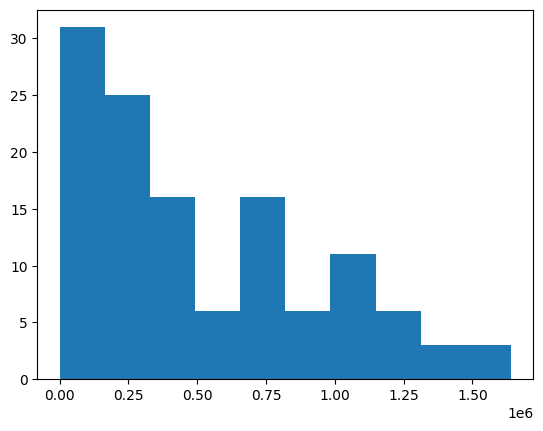

In [51]:
plt.hist(real_df.objective.values)

In [52]:
real_df_cut = real_df#[real_df.objective < 1000.00]

In [53]:
#real_df_cut

In [54]:
# determine categorical and numerical features
numerical_ix = real_df_cut.select_dtypes(include=['int64', 'float64']).columns
categorical_ix = real_df_cut.select_dtypes(include=['object', 'bool']).columns

In [55]:
print(numerical_ix)
print(categorical_ix)

Index(['p0', 'p1', 'p2', 'objective'], dtype='object')
Index([], dtype='object')


In [56]:
from sklearn.base import BaseEstimator, TransformerMixin

class IdentityTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, input_array, y=None):
        return self
    
    def transform(self, input_array, y=None):
        return input_array*1

In [57]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder, MinMaxScaler, OrdinalEncoder
#!pip install scikit-optimize
import skopt
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsRegressor

In [58]:
t = [('cat', OrdinalEncoder(), categorical_ix), ('num', IdentityTransformer(), numerical_ix)]
data_pipeline = ColumnTransformer(transformers=t)

In [59]:
data_pipeline_model = data_pipeline.fit(real_df_cut)

In [60]:
preprocessed_data = data_pipeline_model.transform(real_df_cut)

In [61]:
preprocessed_data.shape

(123, 4)

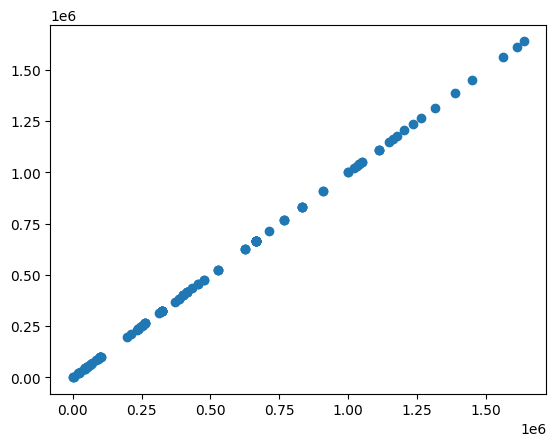

In [63]:
plt.scatter(preprocessed_data[:,3],real_df_cut['objective'].values)

In [64]:
#preprocessed_data[:,4]

In [65]:
regr = RandomForestRegressor()
#regr.fit(preprocessed_data[:,1:],preprocessed_data[:,0])

In [66]:
from sklearn.model_selection import cross_val_score

In [67]:
cv_scores = cross_val_score(regr, preprocessed_data[:,0:3],preprocessed_data[:,3], cv=10)

In [68]:
preprocessed_data.shape

(123, 4)

In [69]:
print(cv_scores)

[ 0.21372386  0.92593144  0.99457705  0.92476177  0.95766553 -0.34103932
  0.14498623  0.99786506  0.49726783  0.80103586]


In [70]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(preprocessed_data[:,0:3], preprocessed_data[:,3], test_size=0.50, 
                                                    random_state=42)

In [71]:
X_train.shape

(61, 3)

In [72]:
regr.fit(X_train,y_train)

RandomForestRegressor()

0.9549535076087731


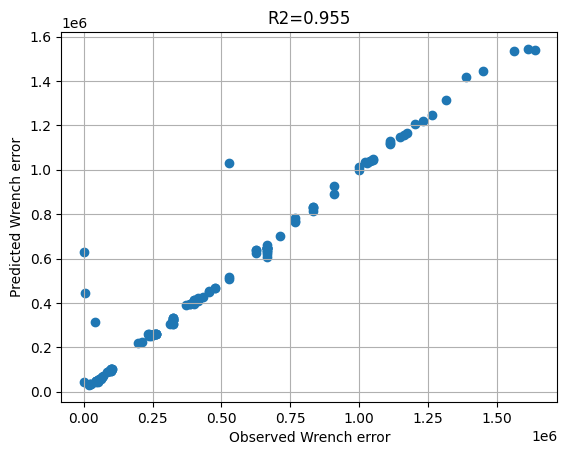

In [73]:
preds = regr.predict(preprocessed_data[:,0:3])
plt.scatter(preprocessed_data[:,3],preds)
r2 = r2_score(preprocessed_data[:,3],preds)
print(r2)
plt.ylabel('Predicted Wrench error')
plt.xlabel('Observed Wrench error')
#plt.suptitle('Wrench simulation error prediction')
plt.title('R2=%1.3f'%r2)
plt.grid()

In [74]:
input_names = real_df_cut.columns.to_list()[:-1]

In [75]:
sorted_idx = regr.feature_importances_.argsort()

In [76]:
print(sorted_idx)
print(input_names)

[1 0 2]
['p0', 'p1', 'p2']


In [77]:
input_names_new = []
for inp in input_names:
    k = inp
    input_names_new.append(k)

In [78]:
input_names = input_names_new

In [79]:
import shap

In [80]:
explainer = shap.TreeExplainer(regr)
shap_values = explainer.shap_values(preprocessed_data[:,0:3])

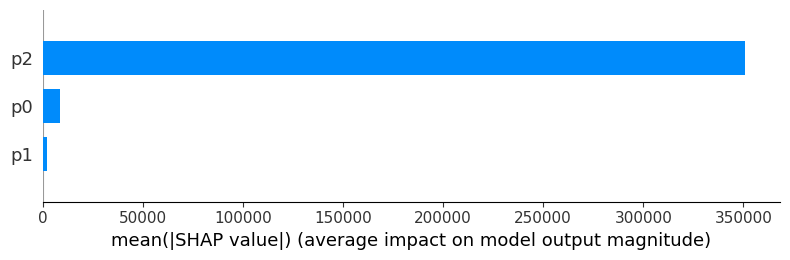

In [81]:
shap.summary_plot(shap_values, feature_names = input_names, plot_type="bar")

In [82]:
X_test1 = pd.DataFrame(preprocessed_data[:,0:3])
X_test1.columns = input_names

In [83]:
#print(X_test1)

In [84]:
import random
random_indices = random.sample(range(X_test1.shape[0]),30)

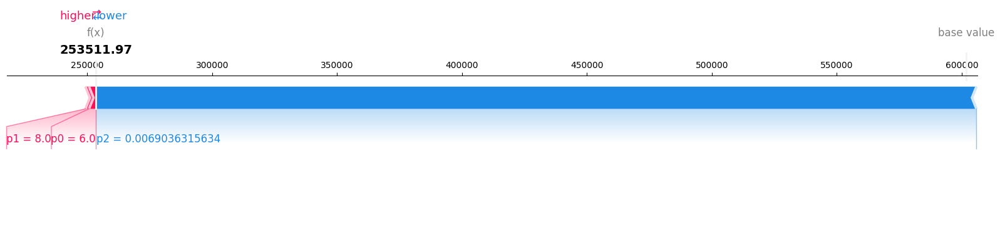

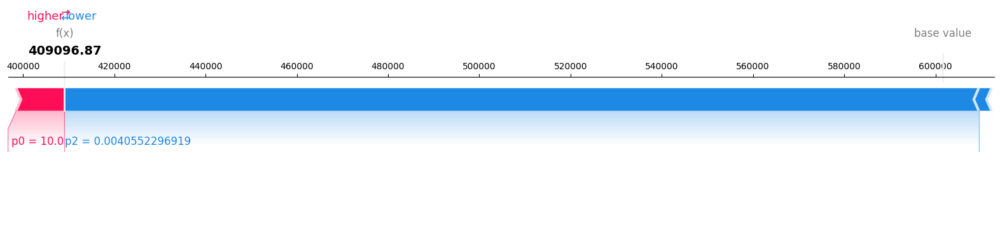

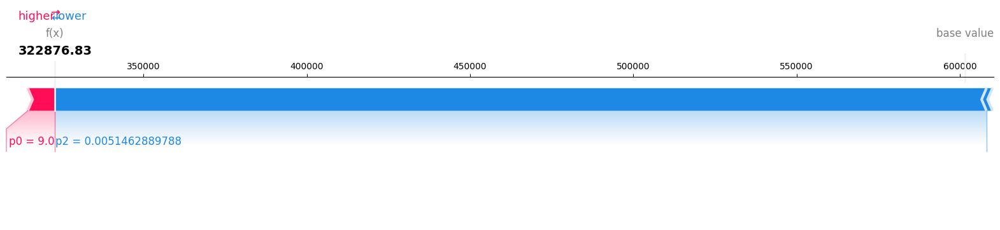

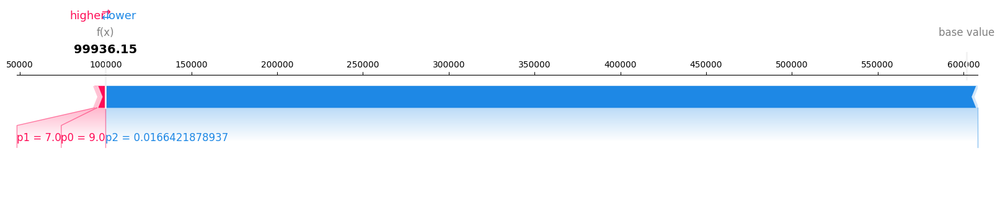

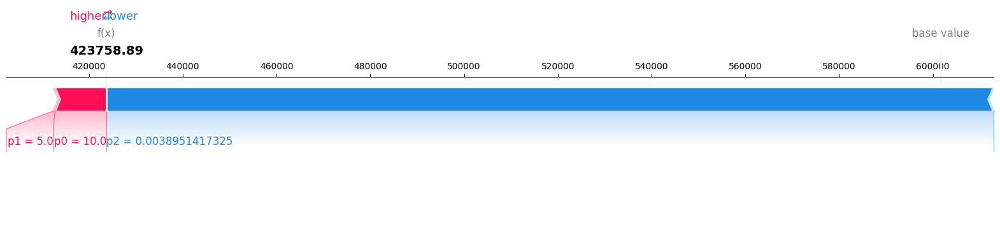

...

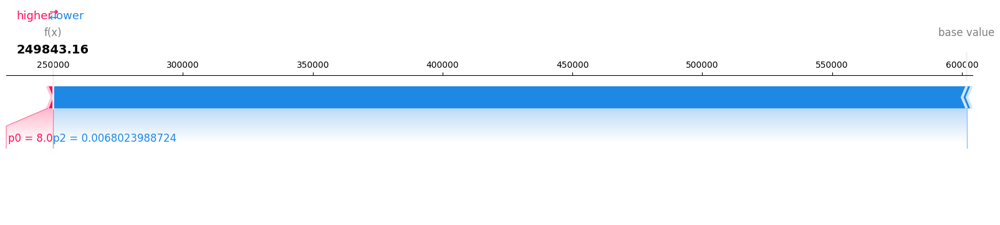

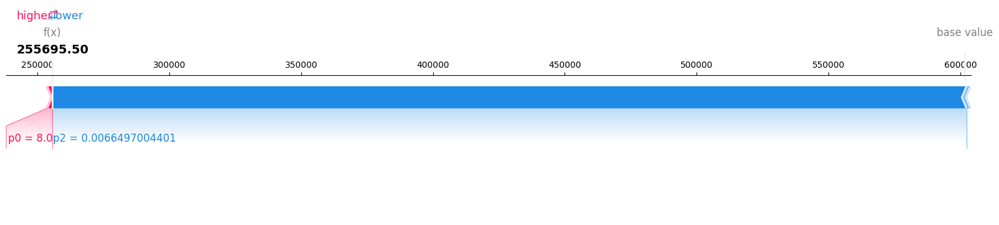

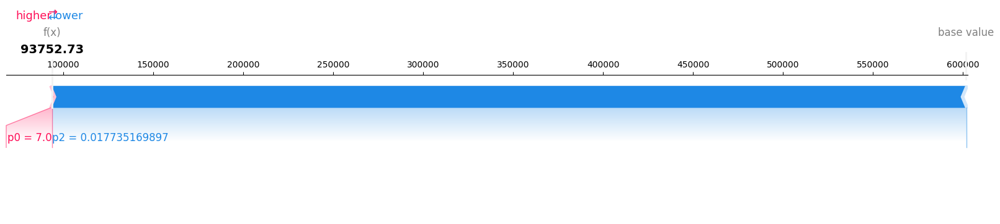

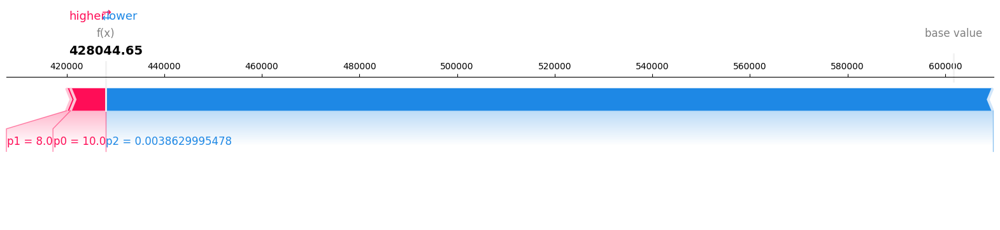

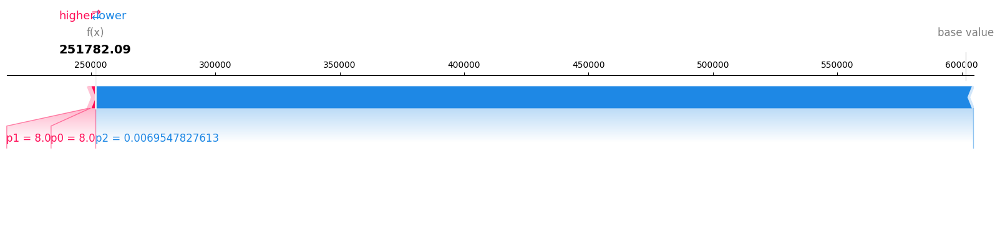

In [85]:
for i in random_indices: 
    choosen_instance = X_test1.loc[[i]]
    shap_values = explainer.shap_values(choosen_instance)
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values, choosen_instance,matplotlib=True)